In [ ]:
!pip install kagglehub[pandas-datasets]

In [ ]:
import kagglehub
from kagglehub import KaggleDatasetAdapter
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pickle
%matplotlib inline

In [ ]:
file_path = "tracks_features.csv"
df = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "rodolfofigueroa/spotify-12m-songs",
  file_path,
)

/tmp/ipython-input-2061559153.py:2: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


In [ ]:
df.head(5)

,id,name,album,album_id,artists,artist_ids,track_number,disc_number,explicit,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year,release_date
0,7lmeHLHBe4nmXzuXc0HDjk,Testify,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],1,1,False,0.470,...,0.0727,0.02610,0.000011,0.3560,0.503,117.906,210133,4.0,1999,1999-11-02
1,1wsRitfRRtWyEapl0q22o8,Guerrilla Radio,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],2,1,True,0.599,...,0.1880,0.01290,0.000071,0.1550,0.489,103.680,206200,4.0,1999,1999-11-02
2,1hR0fIFK2qRG3f3RF70pb7,Calm Like a Bomb,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],3,1,False,0.315,...,0.4830,0.02340,0.000002,0.1220,0.370,149.749,298893,4.0,1999,1999-11-02
3,2lbASgTSoDO7MTuLAXlTW0,Mic Check,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],4,1,True,0.440,...,0.2370,0.16300,0.000004,0.1210,0.574,96.752,213640,4.0,1999,1999-11-02
4,1MQTmpYOZ6fcMQc56Hdo7T,Sleep Now In the Fire,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],5,1,False,0.426,...,0.0701,0.00162,0.105000,0.0789,0.539,127.059,205600,4.0,1999,1999-11-02


In [ ]:
df.columns

Index(['id', 'name', 'album', 'album_id', 'artists', 'artist_ids',
       'track_number', 'disc_number', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature', 'year', 'release_date'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1204025 entries, 0 to 1204024
Data columns (total 24 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   id                1204025 non-null  object 
 1   name              1204022 non-null  object 
 2   album             1204014 non-null  object 
 3   album_id          1204025 non-null  object 
 4   artists           1204025 non-null  object 
 5   artist_ids        1204025 non-null  object 
 6   track_number      1204025 non-null  int64  
 7   disc_number       1204025 non-null  int64  
 8   explicit          1204025 non-null  bool   
 9   danceability      1204025 non-null  float64
 10  energy            1204025 non-null  float64
 11  key               1204025 non-null  int64  
 12  loudness          1204025 non-null  float64
 13  mode              1204025 non-null  int64  
 14  speechiness       1204025 non-null  float64
 15  acousticness      1204025 non-null  float64
 16  

# Exploratory Data Analysis

## Correlation

In [ ]:
correlation=df[[ 'track_number', 'disc_number', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature']].corr()

In [ ]:
correlation

,track_number,disc_number,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
track_number,1.000000,-0.005175,-0.017275,-0.041665,-0.124871,-0.002315,-0.144221,0.012315,0.045695,0.127427,0.037038,0.018261,-0.004484,-0.052612,-0.145419,-0.052433
disc_number,-0.005175,1.000000,-0.034758,-0.073758,-0.078767,-0.005026,-0.097418,0.010846,-0.011852,0.089302,0.027788,0.046580,-0.042987,-0.031209,0.059631,-0.018498
explicit,-0.017275,-0.034758,1.000000,0.194316,0.162870,0.007292,0.163154,-0.053346,0.336887,-0.182155,-0.161286,0.042840,0.056823,0.006945,-0.068231,0.050854
danceability,-0.041665,-0.073758,0.194316,1.000000,0.283016,0.018633,0.378194,-0.021528,0.209859,-0.285750,-0.285331,-0.044328,0.563436,0.060590,-0.135413,0.196605
energy,-0.124871,-0.078767,0.162870,0.283016,1.000000,0.034452,0.817934,-0.035788,0.130813,-0.796242,-0.252131,0.213494,0.399531,0.268231,-0.037603,0.190486
key,-0.002315,-0.005026,0.007292,0.018633,0.034452,1.000000,0.021622,-0.153902,0.022998,-0.027901,-0.014915,0.004419,0.024834,0.006202,-0.005822,0.009714
loudness,-0.144221,-0.097418,0.163154,0.378194,0.817934,0.021622,1.000000,0.000456,0.062403,-0.671553,-0.393037,0.138123,0.385005,0.246248,-0.051889,0.184684
mode,0.012315,0.010846,-0.053346,-0.021528,-0.035788,-0.153902,0.000456,1.000000,-0.046527,0.046134,-0.045574,0.012879,0.039026,0.013946,-0.028679,-0.005941
speechiness,0.045695,-0.011852,0.336887,0.209859,0.130813,0.022998,0.062403,-0.046527,1.000000,-0.082375,-0.167551,0.189012,0.099680,0.007745,-0.078870,0.017881
acousticness,0.127427,0.089302,-0.182155,-0.285750,-0.796242,-0.027901,-0.671553,0.046134,-0.082375,1.000000,0.244132,-0.115001,-0.268836,-0.231021,0.002517,-0.173399


<Axes: >

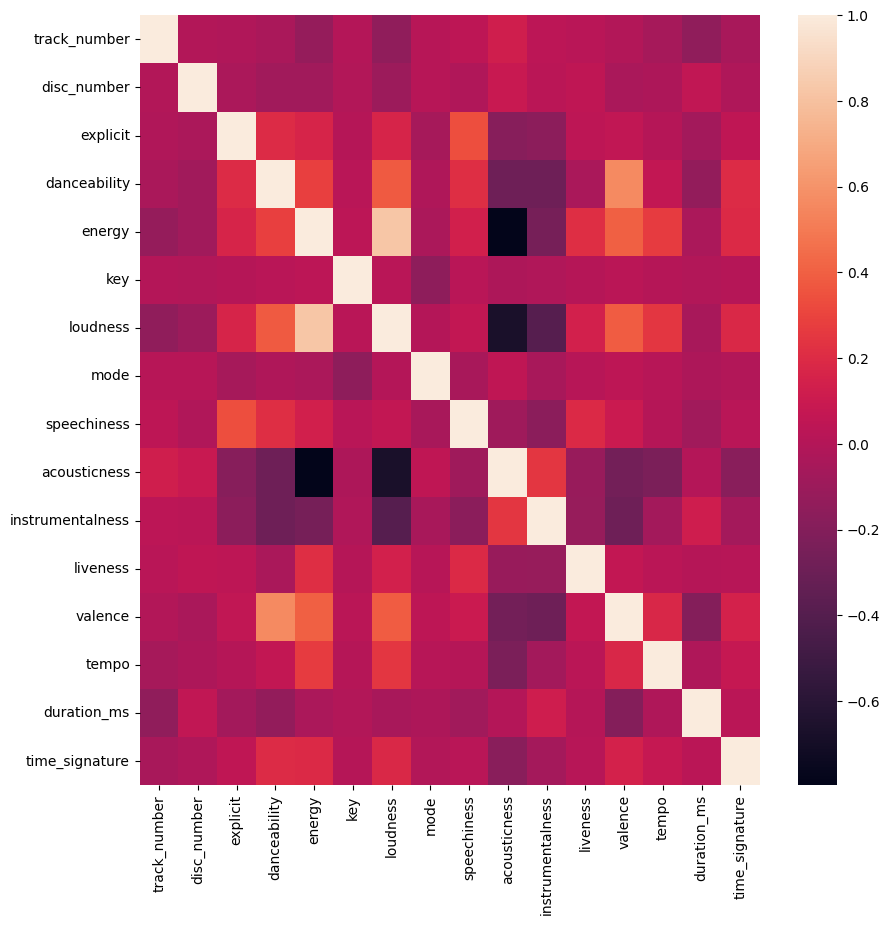

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(correlation,annot=False)

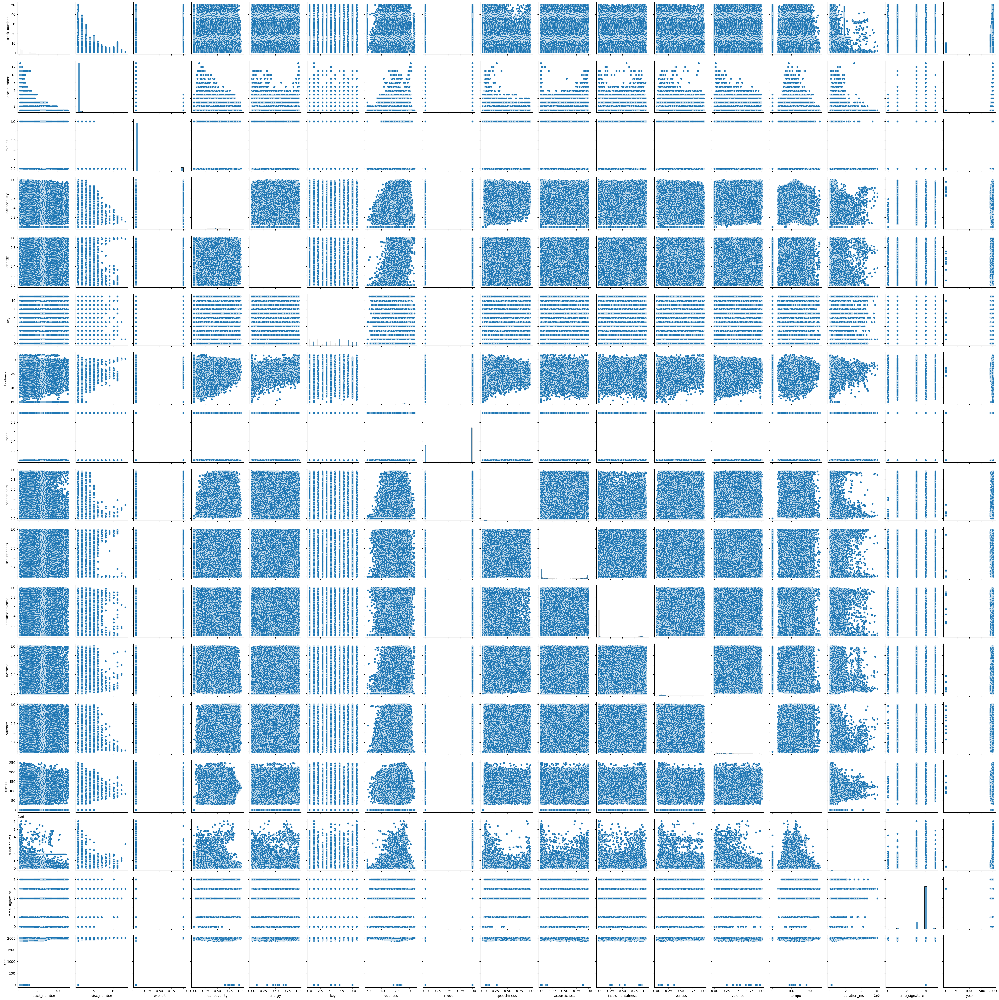

In [ ]:
sns.pairplot(df)

Null Check

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
album,11
name,3
id,0
album_id,0
artists,0
artist_ids,0
track_number,0
disc_number,0
explicit,0
danceability,0


In [ ]:
df.dropna(subset=['album','name'],inplace=True)

In [ ]:
df.isnull().sum().sort_values(ascending=False)

,0
id,0
name,0
album,0
album_id,0
artists,0
artist_ids,0
track_number,0
disc_number,0
explicit,0
danceability,0


Check Duplicates

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.drop_duplicates(inplace=True)

Stats of Audio Features

In [ ]:
audio_features = [
    'danceability', 'energy', 'loudness', 'speechiness',
    'acousticness', 'instrumentalness', 'liveness',
    'valence', 'tempo'
]

In [ ]:
df[audio_features].describe().T

,count,mean,std,min,25%,50%,75%,max
danceability,1204012.0,0.493055,0.189669,0.0,0.356000,0.50100,0.6330,1.000
energy,1204012.0,0.509533,0.294684,0.0,0.252000,0.52400,0.7660,1.000
loudness,1204012.0,-11.808765,6.982141,-60.0,-15.254000,-9.79100,-6.7170,7.234
speechiness,1204012.0,0.084381,0.115991,0.0,0.035100,0.04460,0.0723,0.969
acousticness,1204012.0,0.446755,0.385201,0.0,0.037600,0.38900,0.8610,0.996
instrumentalness,1204012.0,0.282860,0.376285,0.0,0.000008,0.00808,0.7190,1.000
liveness,1204012.0,0.201599,0.180458,0.0,0.096800,0.12500,0.2450,1.000
valence,1204012.0,0.427983,0.270483,0.0,0.191000,0.40300,0.6440,1.000
tempo,1204012.0,117.634065,30.937008,0.0,94.054000,116.72600,137.0460,248.934


Text(0.5, 1.0, 'Distribution of Tempo (BPM)')

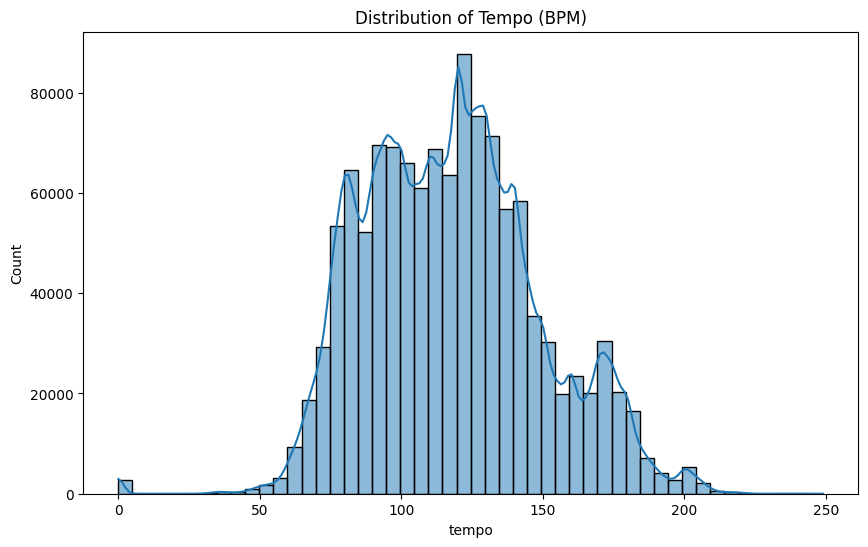

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['tempo'], bins=50, kde=True)
plt.title("Distribution of Tempo (BPM)")

<Axes: xlabel='artists'>

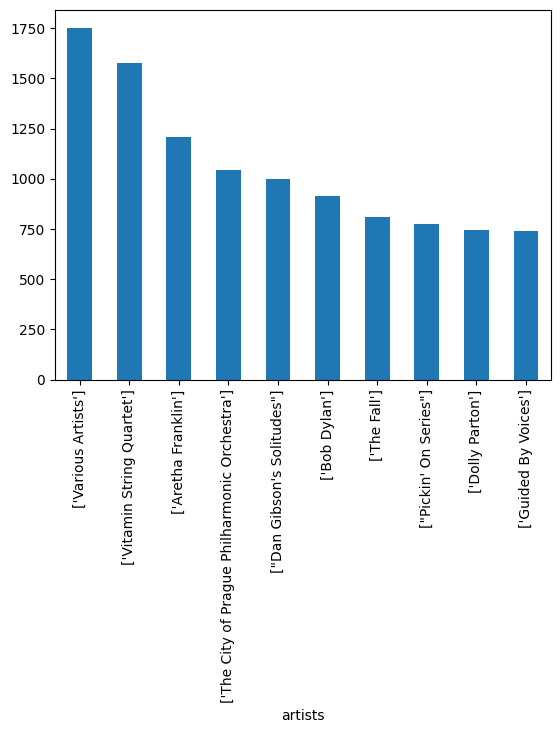

In [ ]:
df['artists'].value_counts().head(10).plot(kind='bar')

Text(0.5, 1.0, 'PCA of Songs Based on Audio Features')

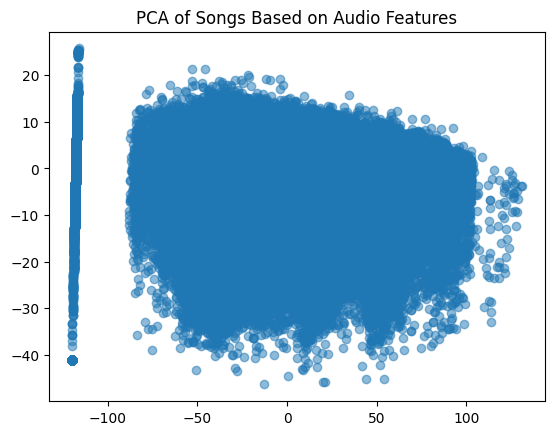

In [ ]:
from sklearn.decomposition import PCA

X = df[audio_features].dropna()
pca = PCA(n_components=2)
components = pca.fit_transform(X)

plt.scatter(components[:, 0], components[:, 1], alpha=0.5)
plt.title("PCA of Songs Based on Audio Features")


In [ ]:
features = [
    'danceability', 'energy', 'loudness', 'speechiness',
    'acousticness', 'instrumentalness', 'liveness',
    'valence', 'tempo'
]

df_features = df[features]

In [ ]:
scaler=StandardScaler()
X=scaler.fit_transform(df_features)

In [ ]:
kMeans=KMeans(n_clusters=10,random_state=42)
df['cluster']=kMeans.fit_predict(X)

In [ ]:
df['cluster']

,cluster
0,2
1,2
2,7
3,2
4,2
...,...
1204020,3
1204021,1
1204022,6
1204023,6


In [ ]:

df_copy = df.drop(columns=['track_number', 'disc_number', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature','year','release_date','artist_ids','album_id'])

In [ ]:

df_small = df_copy.sample(950000)
df_small.to_csv("song_recommender_small.csv")

,id,name,album,artists,cluster
0,7lmeHLHBe4nmXzuXc0HDjk,Testify,The Battle Of Los Angeles,['Rage Against The Machine'],2
1,1wsRitfRRtWyEapl0q22o8,Guerrilla Radio,The Battle Of Los Angeles,['Rage Against The Machine'],2
2,1hR0fIFK2qRG3f3RF70pb7,Calm Like a Bomb,The Battle Of Los Angeles,['Rage Against The Machine'],7
3,2lbASgTSoDO7MTuLAXlTW0,Mic Check,The Battle Of Los Angeles,['Rage Against The Machine'],2
4,1MQTmpYOZ6fcMQc56Hdo7T,Sleep Now In the Fire,The Battle Of Los Angeles,['Rage Against The Machine'],2
...,...,...,...,...,...
1204020,0EsMifwUmMfJZxzoMPXJKZ,Gospel of Juke,Notch - EP,['FVLCRVM'],3
1204021,2WSc2TB1CSJgGE0PEzVeiu,Prism Visions,Notch - EP,['FVLCRVM'],1
1204022,6iProIgUe3ETpO6UT0v5Hg,Tokyo 360,Notch - EP,['FVLCRVM'],6
1204023,37B4SXC8uoBsUyKCWnhPfX,Yummy!,Notch - EP,['FVLCRVM'],6
